# Data Cleaning / Pitch Location EDA
The purpose of this notebook is to continue to clean and prepare data from initial_sql_queries.ipynb for use in a machine learning model to predict pitches.  Additionally, some secondary EDA will be run here.

Importing various packages:

In [1]:
import pickle
from sqlalchemy import create_engine
import pandas as pd
from importlib import reload
import numpy as np
import scipy.stats as st
import matplotlib.pyplot as plt
import seaborn as sns
%config InlineBackend.figure_formats = ['retina']
%matplotlib inline

plt.rcParams['figure.figsize'] = (9, 6)
sns.set(context='notebook', style='whitegrid', font_scale=1.2)

Pickling in the data from initial_sql_queries.ipynb:

In [2]:
pwd

'/Users/patrickbovard/Documents/GitHub/metis_final_project/EDA-SQL'

In [3]:
with open('../Data/combined_pitch_df.pickle','rb') as read_file:
    stats_df = pickle.load(read_file)

In [4]:
stats_df.head()

,inning,batter_id,pitcher_id,top,ab_id,p_score,stand,p_throws,event,home_team,...,pitch_num,last_pitch_type,last_pitch_px,last_pitch_pz,last_pitch_speed,pitcher_full_name,pitcher_run_diff,hitter_full_name,Date_Time_Date,Season
0,1.0,572761,452657,1.0,2.015000e+09,0.0,L,L,Groundout,chn,...,1.0,None,NaN,NaN,NaN,Jon Lester,0.0,Matt Carpenter,2015-04-05,2015
1,1.0,572761,452657,1.0,2.015000e+09,0.0,L,L,Groundout,chn,...,2.0,FF,0.416,2.963,92.9,Jon Lester,0.0,Matt Carpenter,2015-04-05,2015
2,1.0,572761,452657,1.0,2.015000e+09,0.0,L,L,Groundout,chn,...,3.0,FF,-0.191,2.347,92.8,Jon Lester,0.0,Matt Carpenter,2015-04-05,2015
3,1.0,572761,452657,1.0,2.015000e+09,0.0,L,L,Groundout,chn,...,4.0,FF,-0.518,3.284,94.1,Jon Lester,0.0,Matt Carpenter,2015-04-05,2015
4,1.0,572761,452657,1.0,2.015000e+09,0.0,L,L,Groundout,chn,...,5.0,FF,-0.641,1.221,91.0,Jon Lester,0.0,Matt Carpenter,2015-04-05,2015


# Pitch Location EDA
Here, I'll do some continued EDA before moving into cleaning the data to prepare for machine learning.  This section will go through some 

### What pitch do pitchers typically use to follow up with a fastball?

Pitch sequence is an important part of this project.  As EDA showed in initial_sql_queries.ipynb, the four seam fastball is by far the most common first pitch, and pitch overall.  Here, I'll look into what is the most common *second* pitch, when a four-seamer is thrown first.

In [5]:
first_pitch_ff = stats_df[(stats_df.pitch_num == 2) & (stats_df.last_pitch_type == 'FF')]

Assigining the pitch types and counts

In [6]:
second_pitch_counts = list(first_pitch_ff.pitch_type.value_counts())

In [7]:
second_pitch_types = list(first_pitch_ff.pitch_type.value_counts().index)

Plotting out the results:

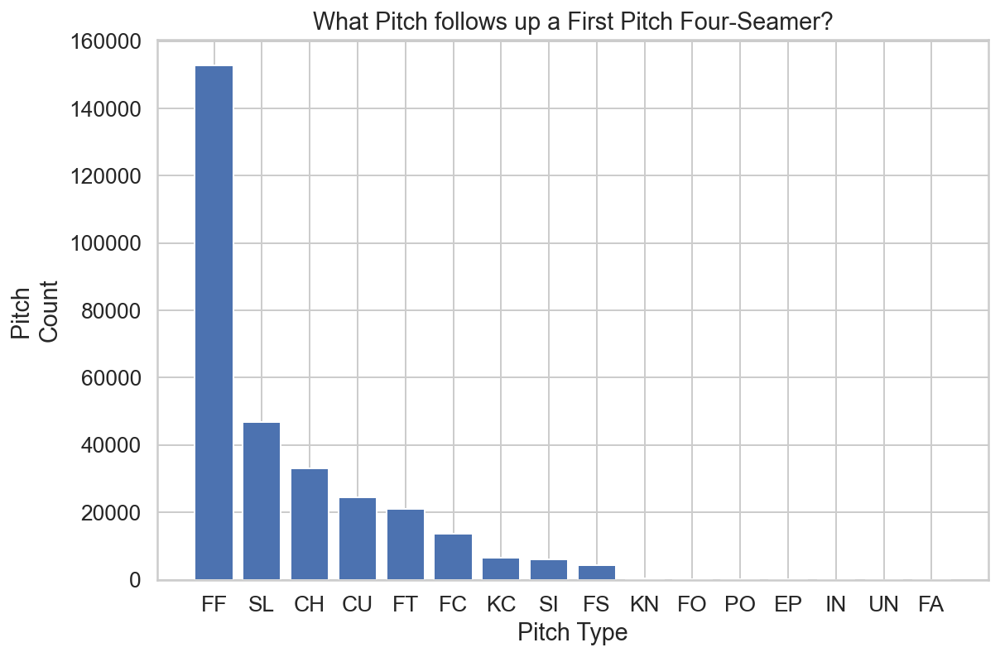

In [8]:
plt.bar(second_pitch_types, second_pitch_counts)
plt.title('What Pitch follows up a First Pitch Four-Seamer?')
plt.xlabel('Pitch Type')
plt.ylabel('Pitch \nCount')
plt.show();

By percents;

In [9]:
second_pitch_rate = [pitch / sum(second_pitch_counts) for pitch in second_pitch_counts]

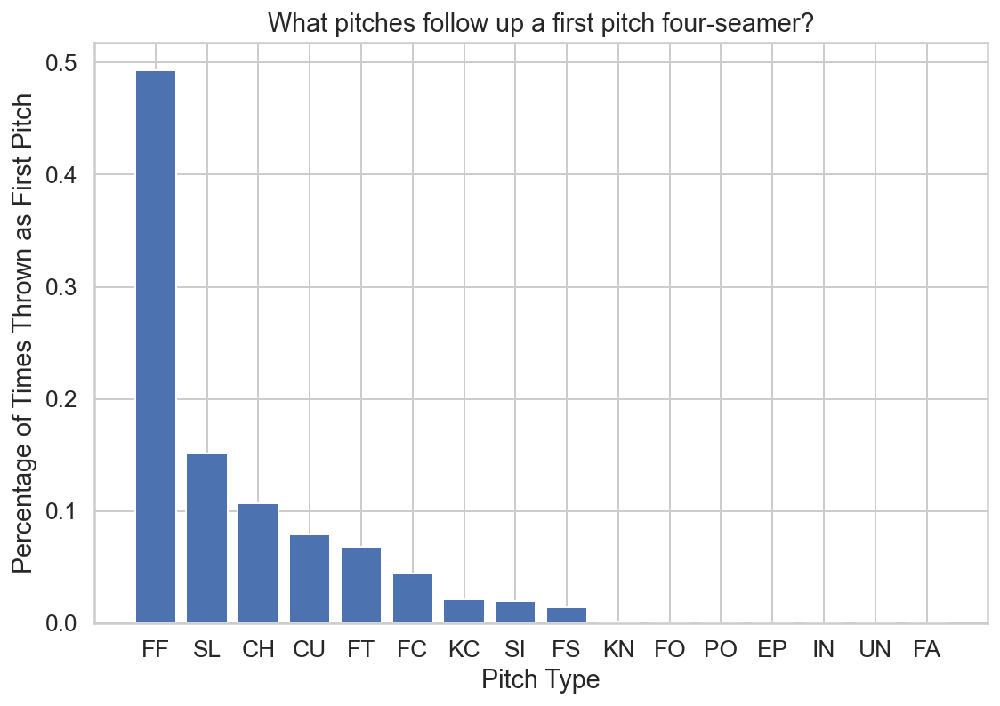

In [10]:
plt.bar(second_pitch_types, second_pitch_rate)
plt.title('What pitches follow up a first pitch four-seamer?')
plt.xlabel('Pitch Type')
plt.ylabel('Percentage of Times Thrown as First Pitch')
plt.show();

Even more heavily a four-seamer than the first pitch.  The other pitches follow suit, but almost 50% of second pitches after a four seamer is another four seamer.  This leads me to believe the location will play a large role here, since a pitcher is unlikely to through the same pitch twice in a row in the same spot.

### What is the common location of each pitch type?

It will be interesting to see where these pitches typically go, in regards to the strikezone.  A scatter plot for each pitch would be an effective way to visualize common pitch locations, with an overlay of the strikezone if possible.  

In baseball, home plate is 17" wide (~1.42 feet).  Thus, I can use that divided in half (0.71 feet) to visualize how far the plate extends to the sides in a scatter plot (i.e., translating the px coordinate in my dataset to feet, centered at 0 at the center of home plate).

The next thing is the bottoma nd top of the strike zone.  This is variable by player, but the original dataset has the top and bottom, so for visualization sake I will take the average bottom and top.

Reading in the original pitch data file, just to get the average top and bottom of the strikezone.

In [11]:
zone_metrics = pd.read_csv('../Data/Kaggle_Files/combined_pitches.csv')

/Users/patrickbovard/opt/anaconda3/envs/metis/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3146: DtypeWarning: Columns (5,6,15,19,21,27) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [13]:
zone_metrics.sz_bot.mean()

1.5740122225278455

In [14]:
zone_metrics.sz_top.mean()

3.4219693356421317

What are the max and min px and pz values?

In [15]:
zone_metrics.px.describe()

count    3.575126e+06
mean     1.304349e-02
std      8.849812e-01
min     -1.054333e+01
25%     -5.806576e-01
50%      2.000000e-02
75%      6.106459e-01
max      1.295291e+01
Name: px, dtype: float64

In [16]:
zone_metrics.pz.describe()

count    3.575126e+06
mean     2.253077e+00
std      9.497987e-01
min     -5.183664e+00
25%      1.645000e+00
50%      2.258000e+00
75%      2.865172e+00
max      1.488624e+01
Name: pz, dtype: float64

So, I'll set the top of the zone (for visualization purposes) at 3.42 and the bottom at 1.57:

In [17]:
#Default Strikezone imagine layout:
def strikezone_layout():
    plt.xlim(-4, 4)
    plt.ylim(0,5)
    plt.hlines(y=1.57, xmin=-0.71, xmax=0.71)
    plt.hlines(y=3.42, xmin=-0.71, xmax=0.71)
    plt.vlines(x=-0.71, ymin=1.57, ymax=3.42)
    plt.vlines(x=0.71, ymin=1.57, ymax=3.42)
    plt.show();

Now, to plot each pitch type on there, with low alpha values so it can display as a "heat map" of sorts, first starting with pitcher Lance Lynn as a proof of concept:

In [18]:
ff_px = stats_df[(stats_df.pitcher_full_name == 'Lance Lynn') & (stats_df.pitch_type == 'FF')].px
ff_pz = stats_df[(stats_df.pitcher_full_name == 'Lance Lynn') & (stats_df.pitch_type == 'FF')].pz

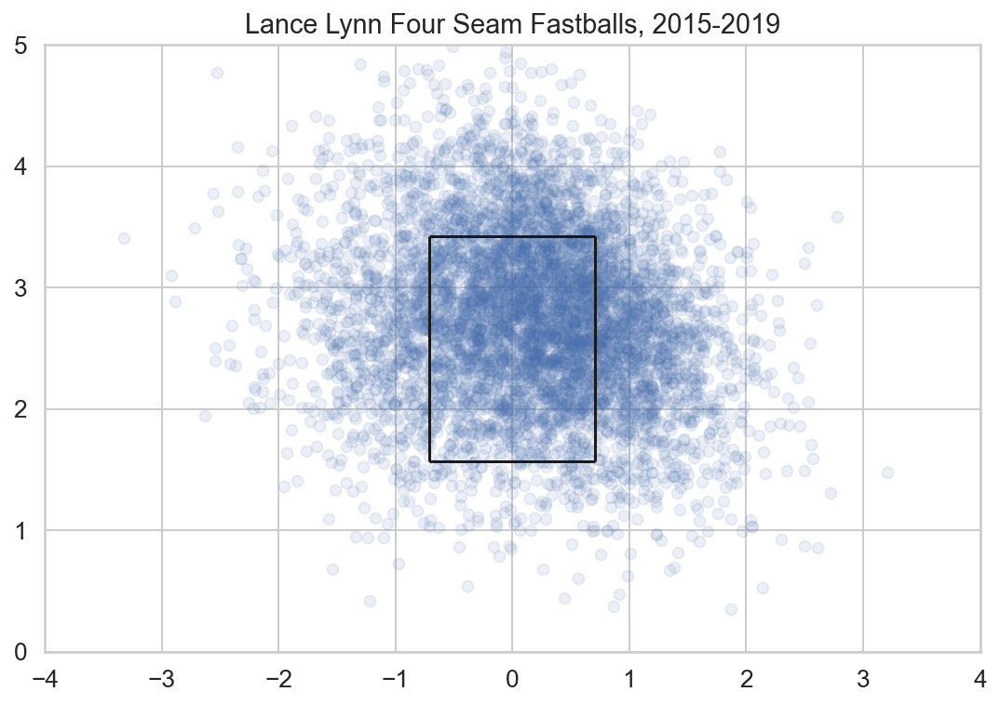

In [19]:
plt.scatter(ff_px, ff_pz, alpha = 0.1)
plt.title('Lance Lynn Four Seam Fastballs, 2015-2019')
strikezone_layout();

This makes sense, with a heavier concentration of fastballs high-middle, trending inside, in the zone.

Sean Doolittle was a pitcher who relied heavily on a four seamer.  Does his location look different on first pitch four seamers compared to second pitch?

In [20]:
sd_first_ff_px = stats_df[(stats_df.pitcher_full_name == 'Sean Doolittle') & (stats_df.pitch_type == 'FF') & (stats_df.pitch_num == 1)].px
sd_first_ff_pz = stats_df[(stats_df.pitcher_full_name == 'Sean Doolittle') & (stats_df.pitch_type == 'FF') & (stats_df.pitch_num == 1)].pz

In [21]:
sd_second_ff_px = stats_df[(stats_df.pitcher_full_name == 'Sean Doolittle') & (stats_df.pitch_type == 'FF') & (stats_df.pitch_num == 2)].px
sd_second_ff_pz = stats_df[(stats_df.pitcher_full_name == 'Sean Doolittle') & (stats_df.pitch_type == 'FF') & (stats_df.pitch_num == 2)].pz

Now plotting:

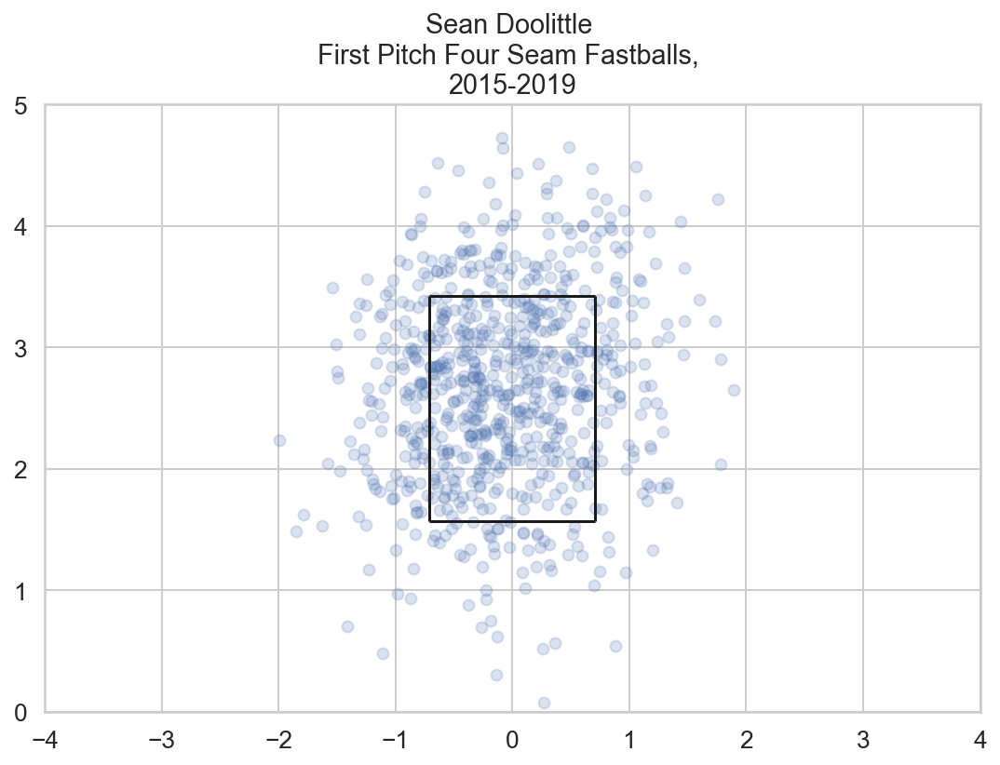

In [22]:
plt.scatter(sd_first_ff_px, sd_first_ff_pz, alpha = 0.2)
plt.title('Sean Doolittle \nFirst Pitch Four Seam Fastballs, \n2015-2019')
strikezone_layout();

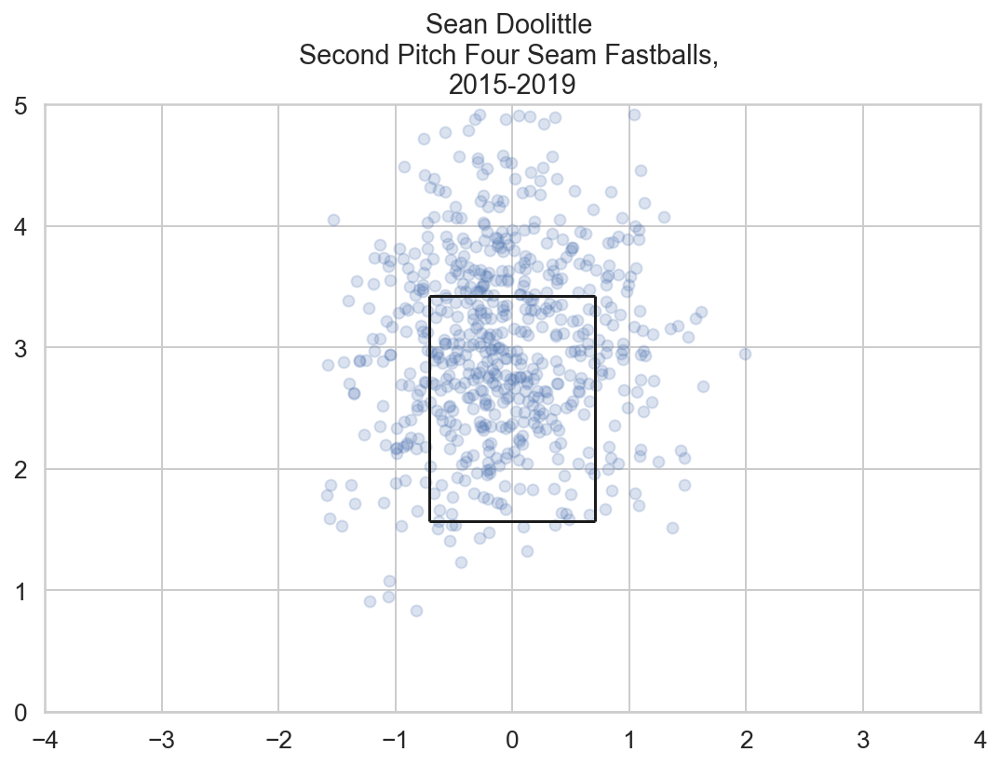

In [23]:
plt.scatter(sd_second_ff_px, sd_second_ff_pz, alpha = 0.2)
plt.title('Sean Doolittle \nSecond Pitch Four Seam Fastballs, \n2015-2019')
strikezone_layout();

There is a definite shift here, with seemingly more pitches going inside on right handed hitters first pitch, then more middle-up second pitch.

What about Rich Hill's Curveball?

In [24]:
cu_px = stats_df[(stats_df.pitcher_full_name == 'Rich Hill') & (stats_df.pitch_type == 'CU')].px
cu_pz = stats_df[(stats_df.pitcher_full_name == 'Rich Hill') & (stats_df.pitch_type == 'CU')].pz

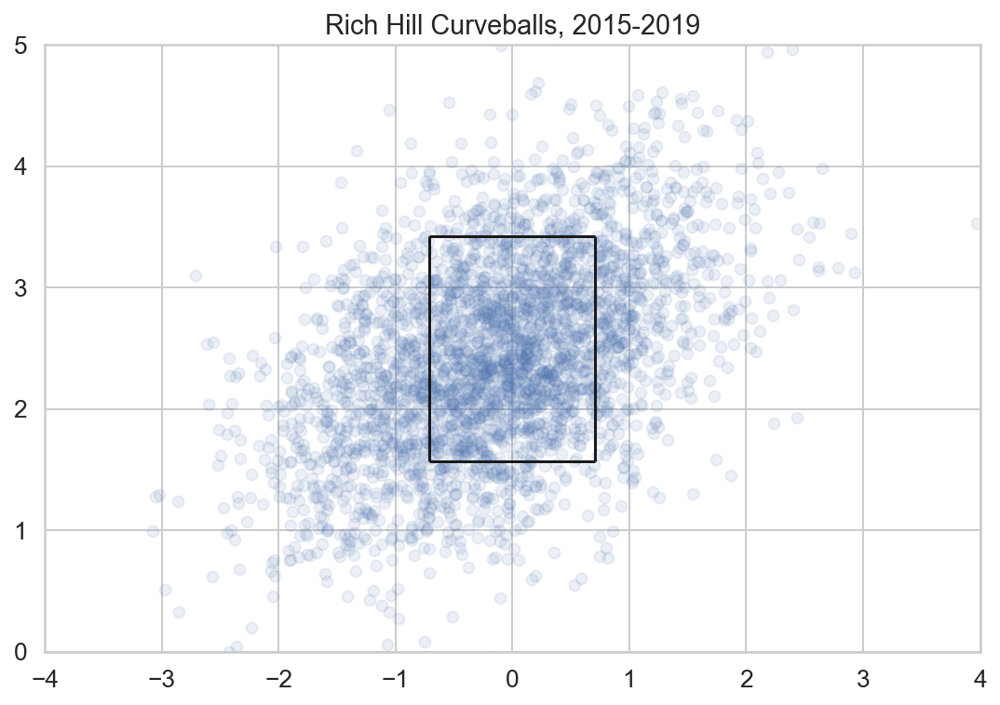

In [25]:
plt.scatter(cu_px, cu_pz, alpha = 0.1)
plt.title('Rich Hill Curveballs, 2015-2019')
strikezone_layout();

With Rich Hill being a left handed pitcher, this makes sense - the ball breaks from the top right of the plot to the bottom left (approximately), so there shoudl be more towards the bottom left of the zone here.

One last pitch example - Dallas Keuchel's two seamer (sometimes called a sinker colloquially):

In [26]:
ft_px = stats_df[(stats_df.pitcher_full_name == 'Dallas Keuchel') & (stats_df.pitch_type == 'FT')].px
ft_pz = stats_df[(stats_df.pitcher_full_name == 'Dallas Keuchel') & (stats_df.pitch_type == 'FT')].pz

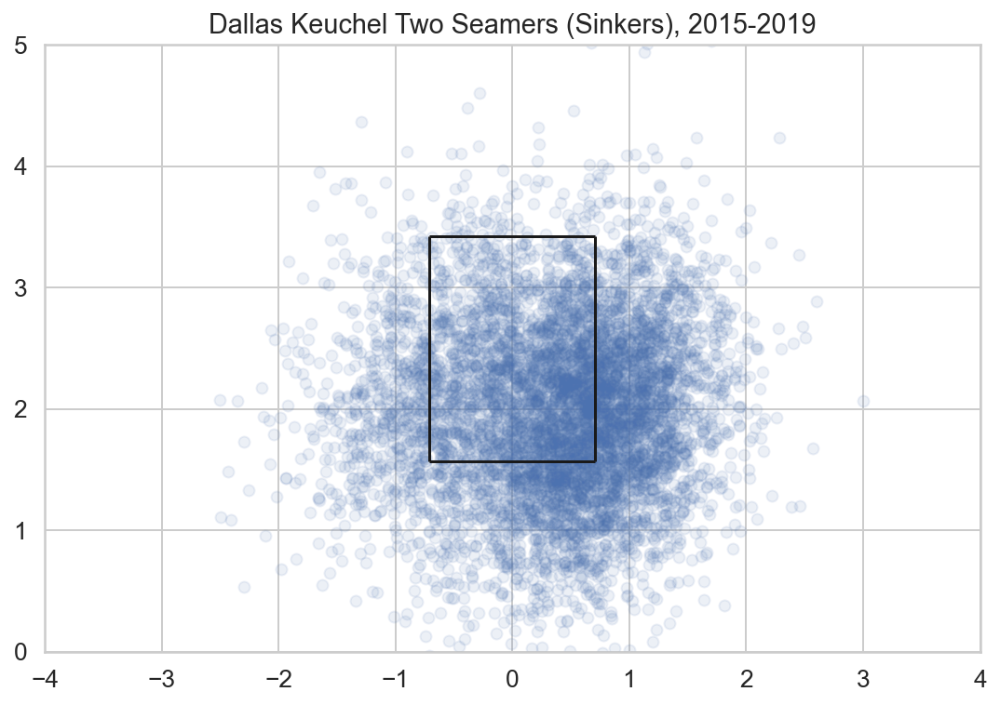

In [27]:
plt.scatter(ft_px, ft_pz, alpha = 0.1)
plt.title('Dallas Keuchel Two Seamers (Sinkers), 2015-2019')
strikezone_layout();

This makes sense again, as they tend to run on the outside of hte plate to right handers (right side), and low in the zone to try to induce ground ball outs (i.e. batter swings down on it, hits into the ground).

What about multiple pitches from a single pitcher?  I'll try out Lucas Giolito here.

In [28]:
stats_df[(stats_df.pitcher_full_name == 'Lucas Giolito')].pitch_type.value_counts()

FF    3451
CH    1359
SL     938
FT     595
CU     571
Name: pitch_type, dtype: int64

In [29]:
giolito_pitchs = list(stats_df[(stats_df.pitcher_full_name == 'Lucas Giolito')].pitch_type.value_counts().index)

In [30]:
len(giolito_pitchs)

5

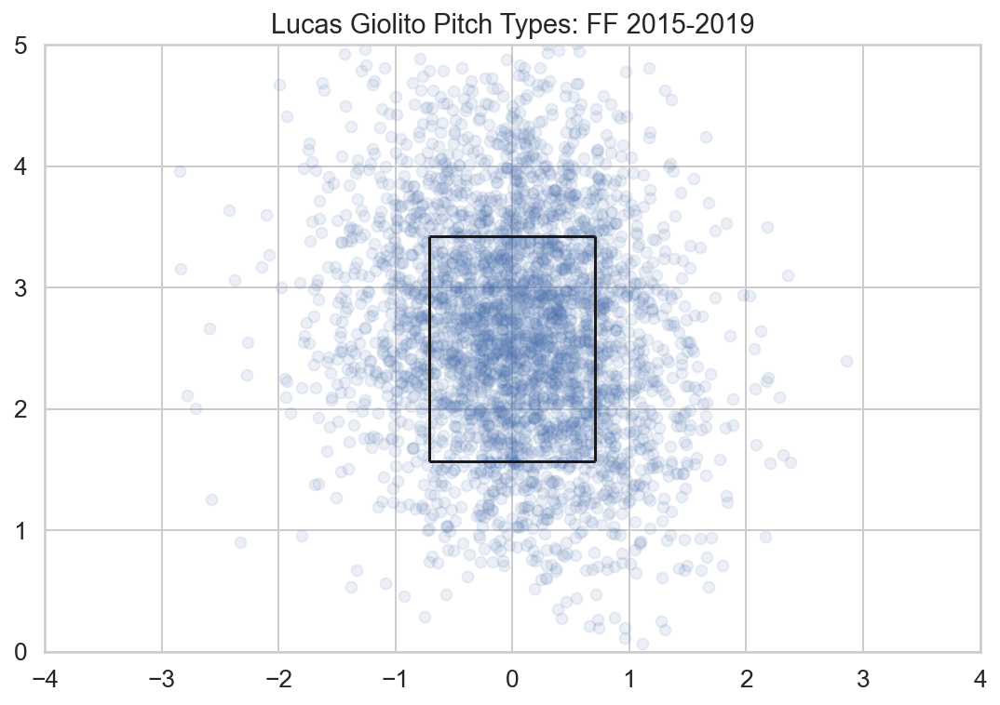

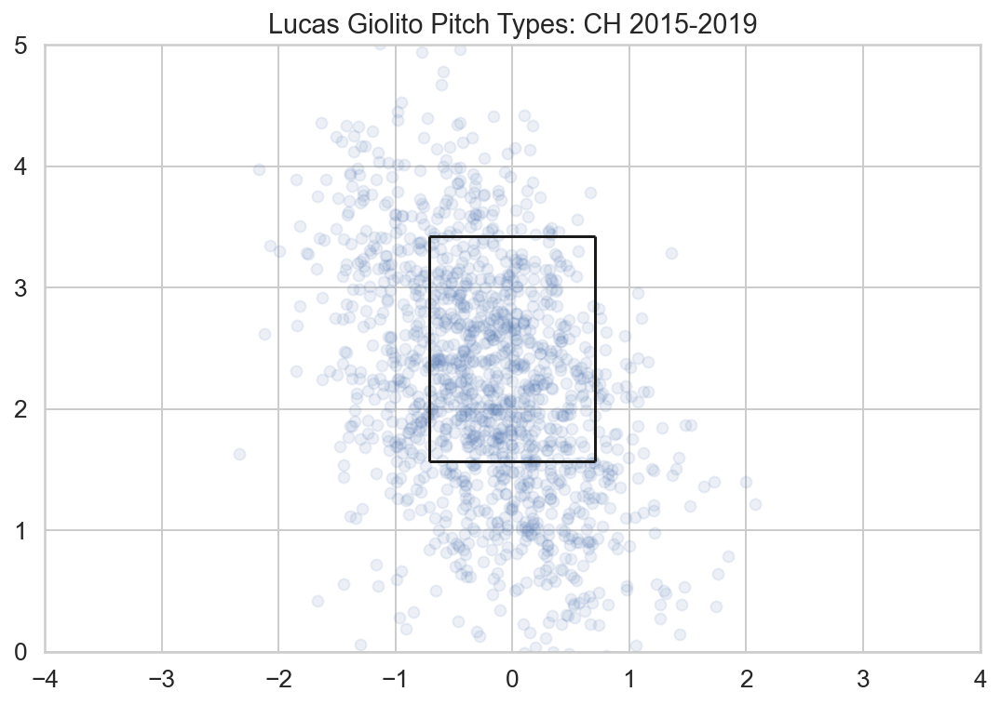

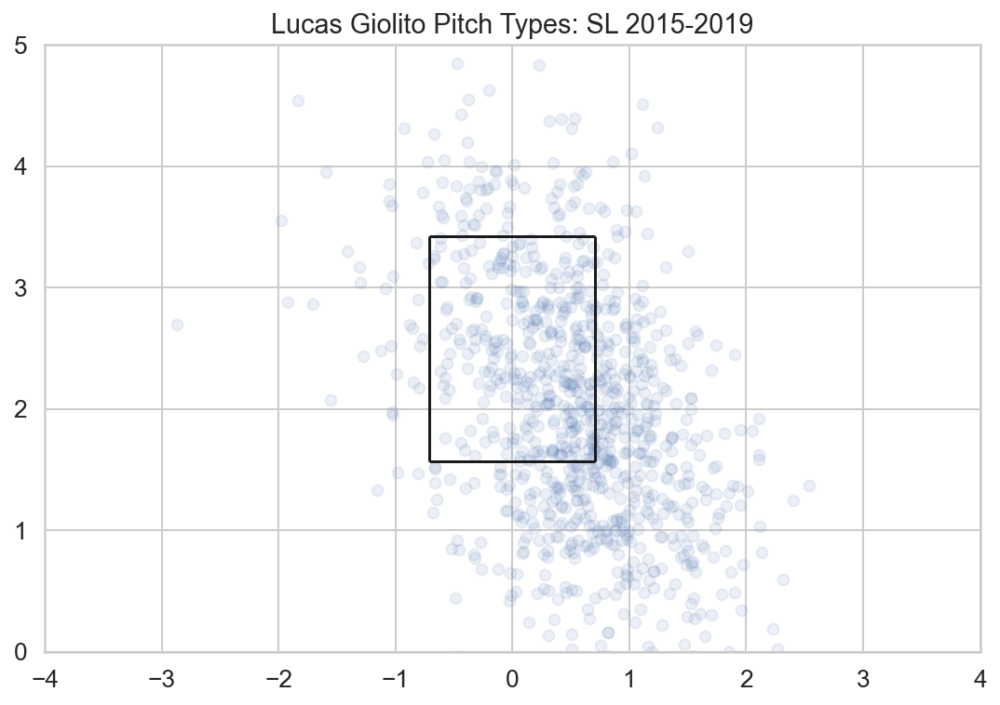

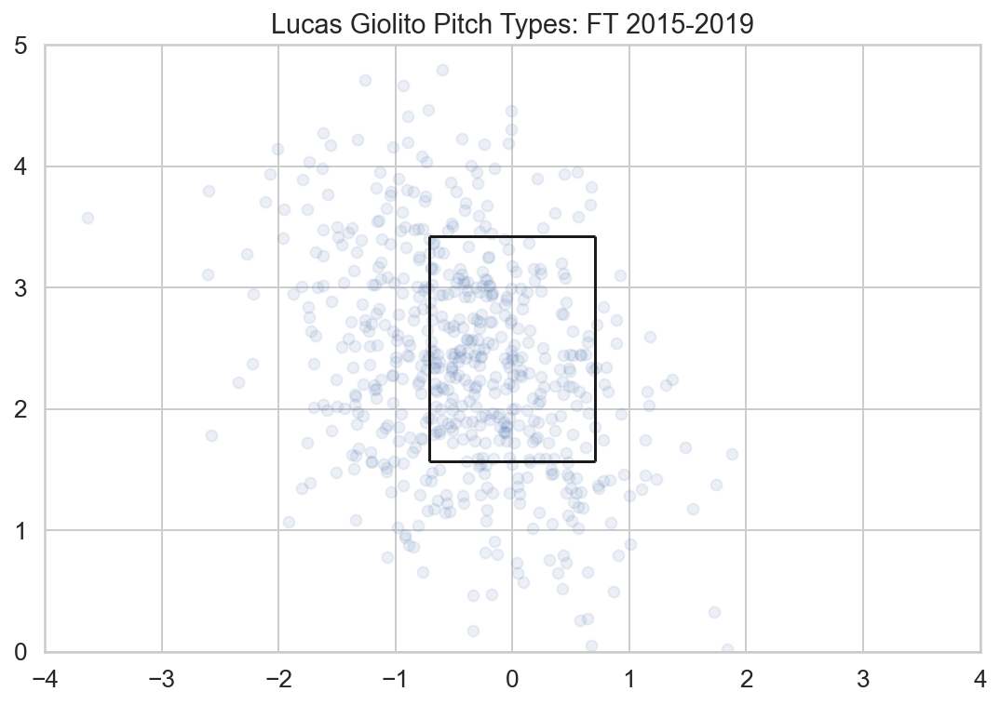

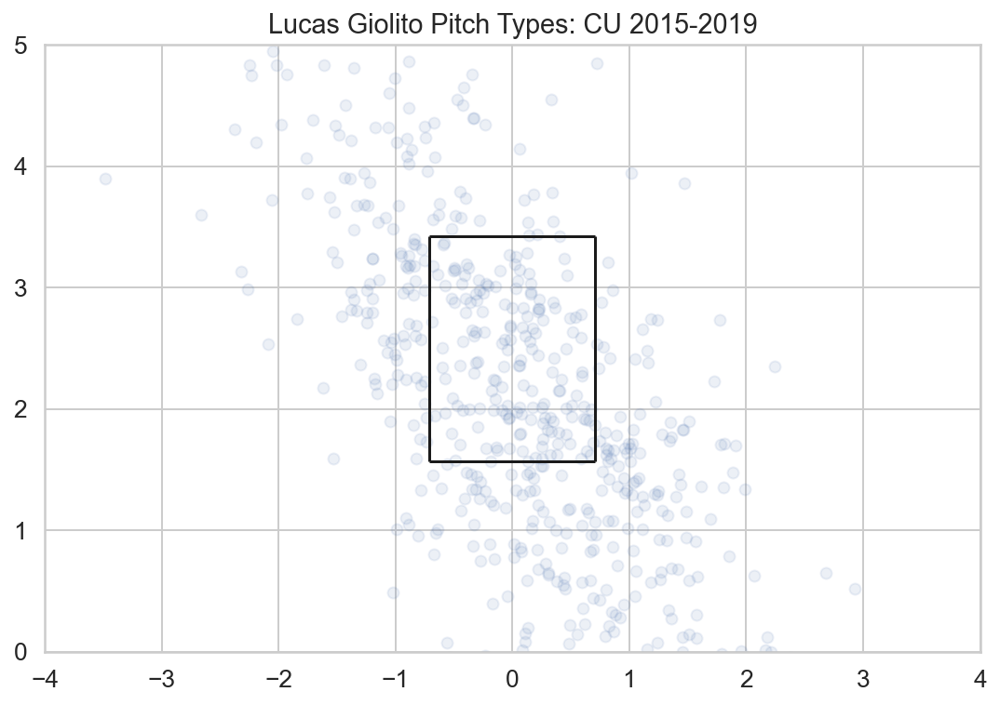

In [31]:
for pitch in giolito_pitchs:
    pitch_x = stats_df[(stats_df.pitcher_full_name == 'Lucas Giolito') & (stats_df.pitch_type == pitch)].px
    pitch_z = stats_df[(stats_df.pitcher_full_name == 'Lucas Giolito') & (stats_df.pitch_type == pitch)].pz
    plt.scatter(pitch_x, pitch_z, alpha = 0.1)
    plt.title('Lucas Giolito Pitch Types: {} 2015-2019'.format(pitch))
    strikezone_layout();

Based on the above for his main pitches, Giolito's fastball is middle-up in the zone typically.  Conversely, the chanegup runs low, which intuitively makes sense since the goal of the changeup is to throw a batter off from the fastball.  His changeup is also notorious for "dropping off the table", ie running low in the zone.  The slider is off the to the bottom right mainly, which means he is trying to throw it "drifting away" from a right handed batter, to induce a swing and miss, or weak contact if hit.

### What about global pitch trends (i.e., general locations of the various pitch types)?

As this shows, different pitches have different typical locations.  Finally, trying on the whole pitcher dataset to get a sense for the "global" location norms by pitch type:

In [32]:
global_pitchs = list(stats_df.pitch_type.value_counts().index)

In [33]:
len(global_pitchs)

18

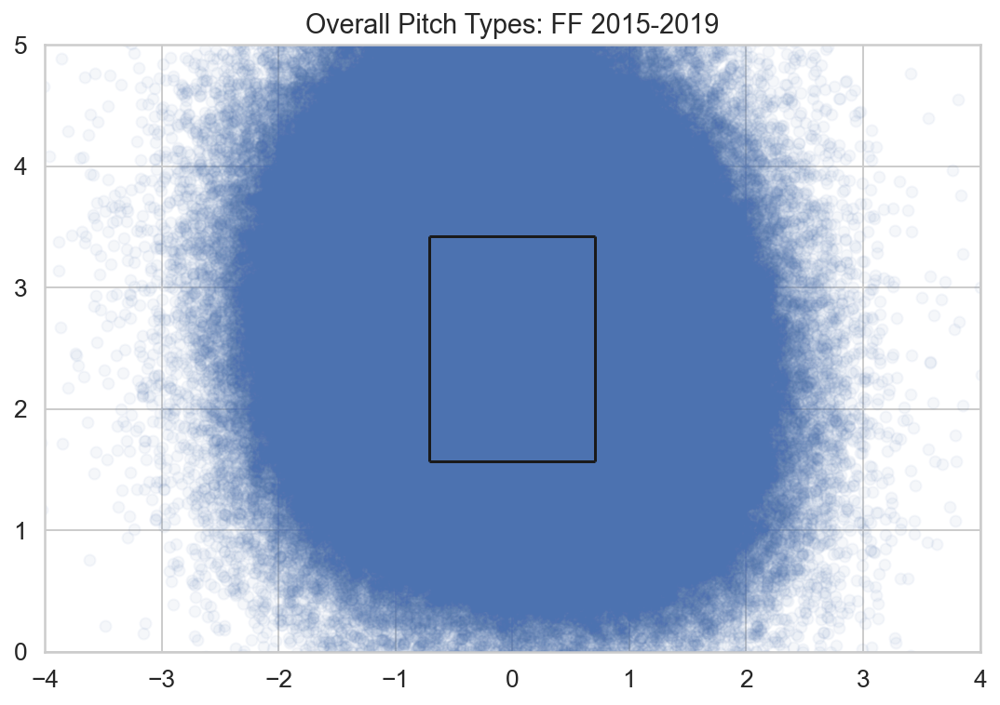

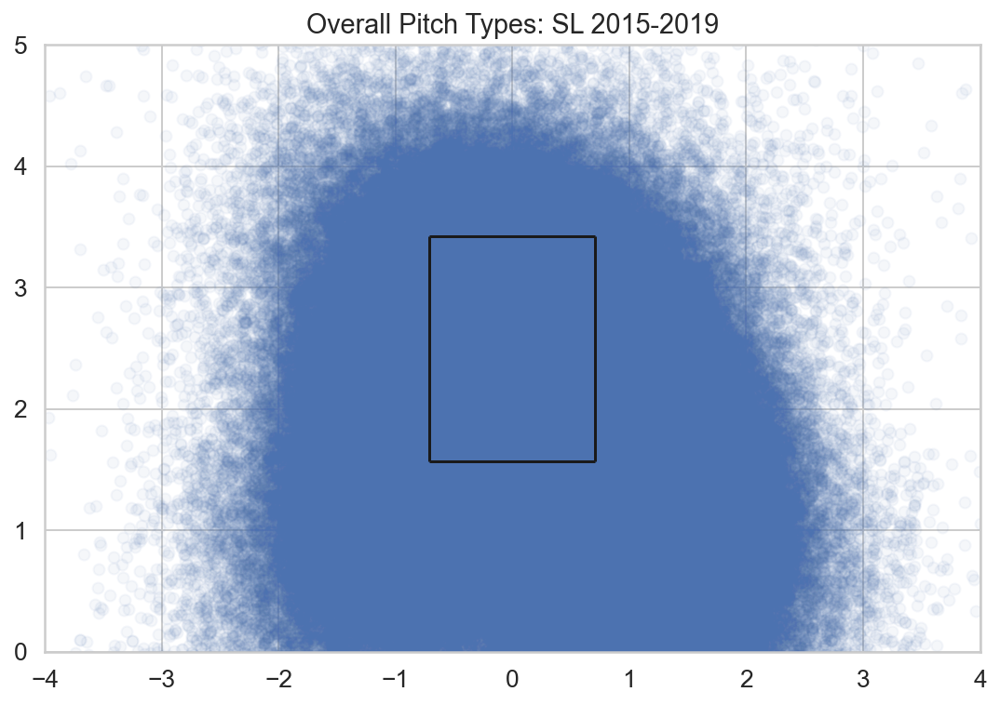

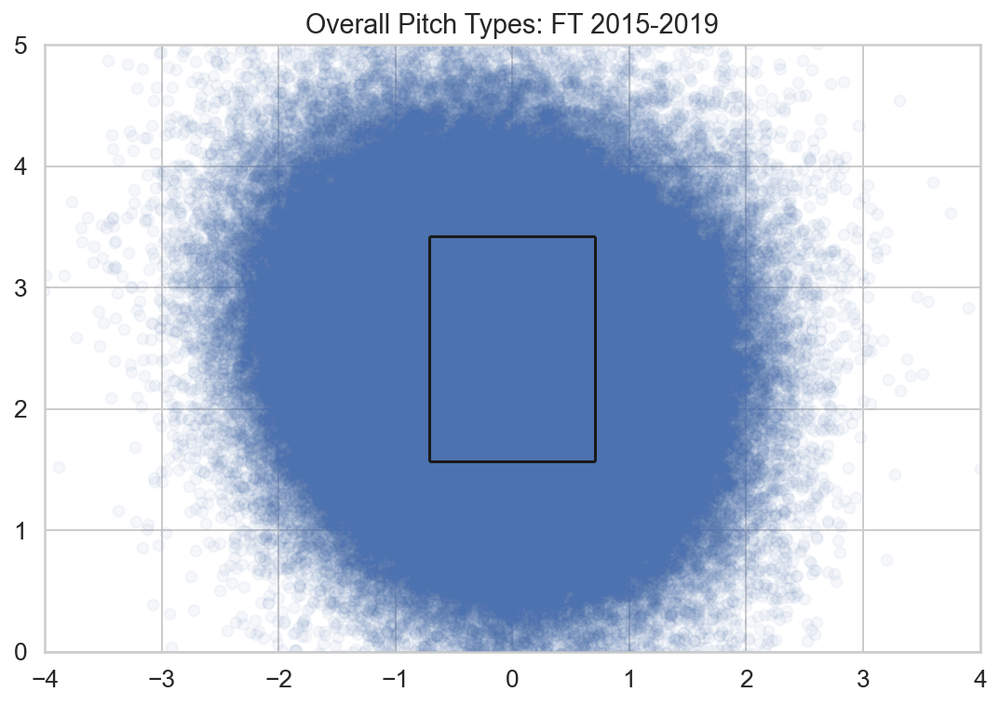

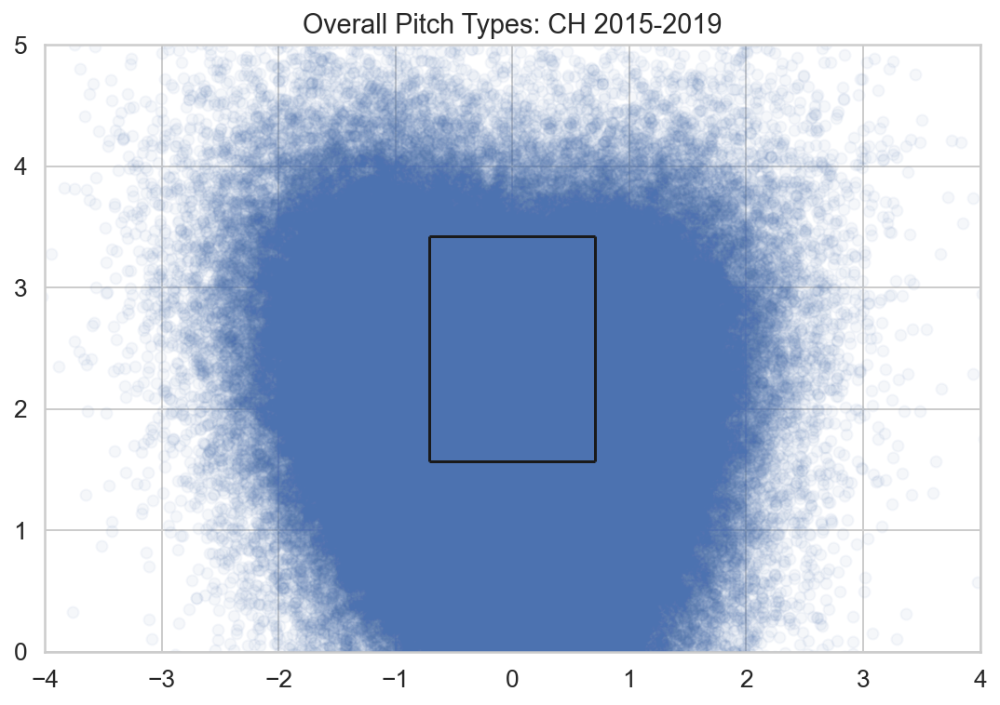

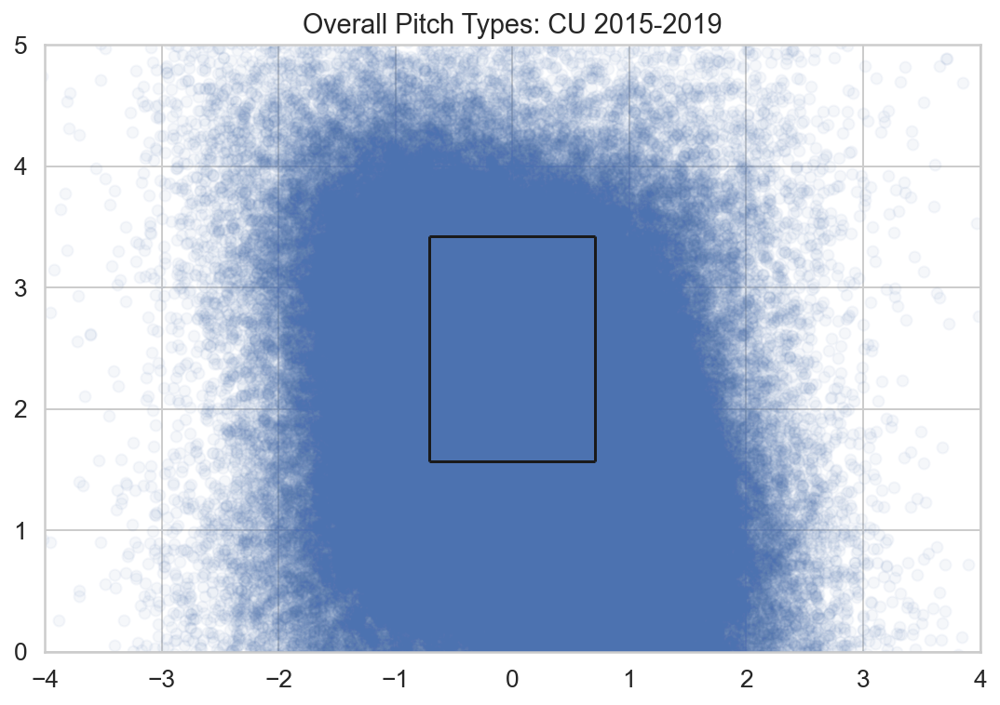

...

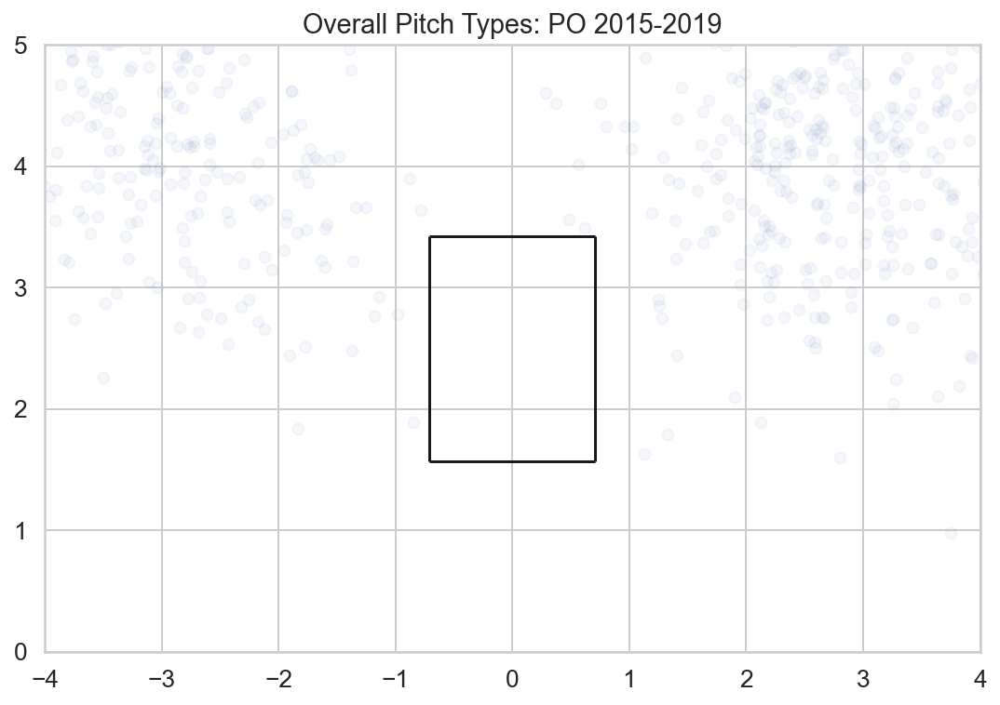

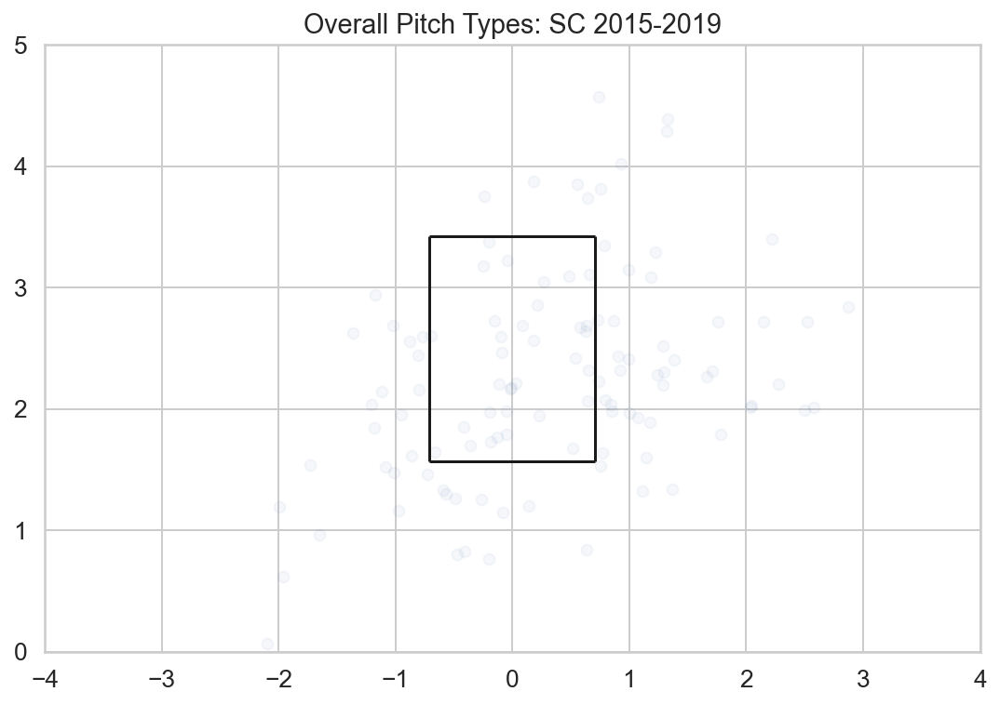

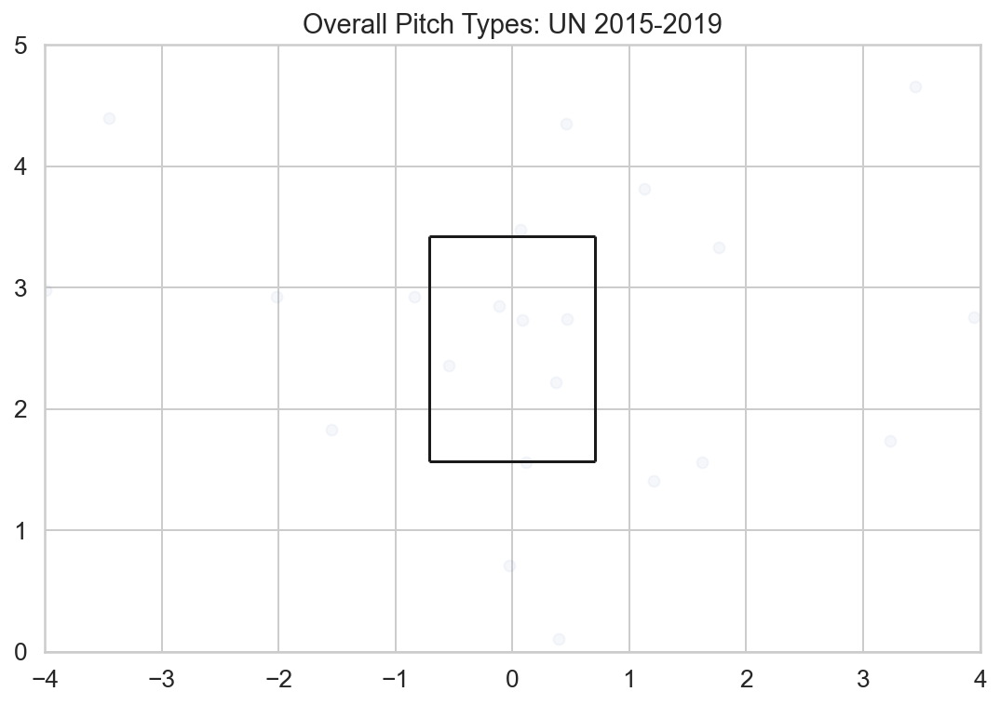

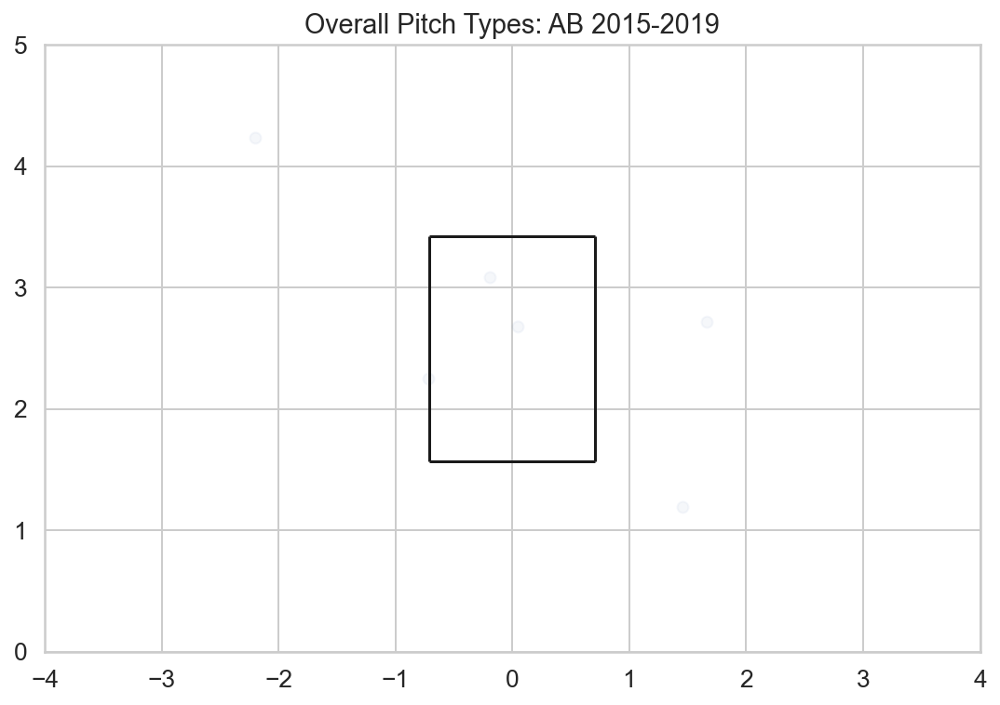

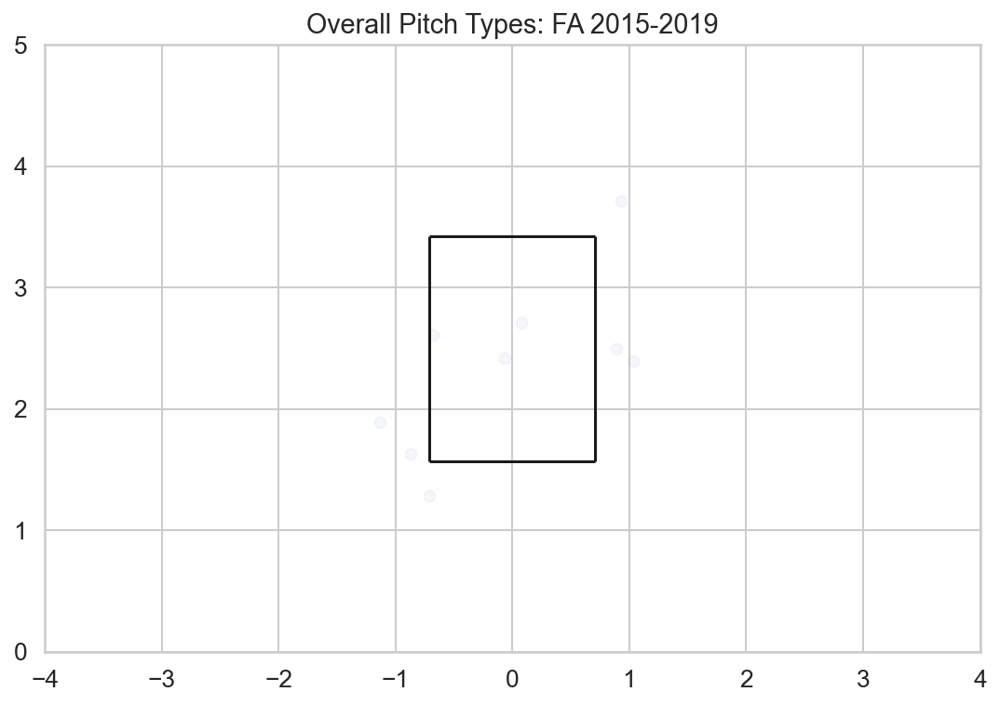

In [34]:
for i, pitch in enumerate(global_pitchs, 1):
    pitch_x = stats_df[(stats_df.pitch_type == pitch)].px
    pitch_z = stats_df[(stats_df.pitch_type == pitch)].pz
    plt.scatter(pitch_x, pitch_z, alpha = 0.05)
    plt.title('Overall Pitch Types: {} 2015-2019'.format(pitch))
    strikezone_layout();

Not the most telling plots in terms of individual zone, but the movement of the thick "clouds" show how these pitches would typically be thrown.  For example, splitters (FS) tend to be lower in the zone and on the left part of the plate, whereas four seamers (FF) tend to run a lot higher.

Overall, I think this shows good visualization into the pitch locations and I can move into more data cleaning.  These visualization have been important to see how different pitches vary by location, and even how the pitch number in an at bat can affect where a pitch is thrown.

# Cleaning

Here, I'll be doing some basic data cleaning to help prep it for use in machine learning.

### Pitch Type - Removing Bad Types

First up, I need to remove pitches that don't add value, such as pitch outs, automatic balls, unknowns, etc.

In [35]:
global_pitchs

['FF',
 'SL',
 'FT',
 'CH',
 'CU',
 'SI',
 'FC',
 'KC',
 'FS',
 'KN',
 'IN',
 'EP',
 'FO',
 'PO',
 'SC',
 'UN',
 'AB',
 'FA']

In [36]:
bad_pitches = ['IN', 'PO', 'UN', 'FA', 'AB']

In [37]:
clean_pitch_type = stats_df[(stats_df.pitch_type != 'IN') & (stats_df.pitch_type != 'PO') & (stats_df.pitch_type != 'UN') & (stats_df.pitch_type != 'FA') & (stats_df.pitch_type != 'AB')]

### Names

With the pitcher full name and hitter full name columns, I can drop the first and last name columns, since those are redundant.

In [38]:
clean_pitch_type.drop(columns=['pitcher_first_name', 'pitcher_last_name', 'hitter_first_name', 'hitter_last_name'], inplace=True)

/Users/patrickbovard/opt/anaconda3/envs/metis/lib/python3.8/site-packages/pandas/core/frame.py:4167: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


## Null Values

Here I'll check on the null values of the dataset, to see if there are any significant issues.

In [39]:
clean_pitch_type.isnull().sum()

inning                    0
batter_id                 0
pitcher_id                0
top                       0
ab_id                     0
p_score                   0
stand                     0
p_throws                  0
event                     0
home_team                 0
away_team                 0
b_score                 173
on_1b                   173
on_2b                   173
on_3b                   173
px                    20991
pz                    20991
zone                  20991
pitch_type            20991
start_speed           20916
type                    173
b_count                 173
s_count                 173
outs                    173
pitch_num               173
last_pitch_type      939011
last_pitch_px        939011
last_pitch_pz        939011
last_pitch_speed     938961
pitcher_full_name     81607
pitcher_run_diff        173
hitter_full_name      64349
Date_Time_Date            0
Season                    0
dtype: int64

### Px, Py, Zone, and Start Speed (20991)
These have the same exact count, so they seem to be related.  I'll start there.

In [40]:
clean_pitch_type[clean_pitch_type.px.isnull()].pitch_type.value_counts()

Series([], Name: pitch_type, dtype: int64)

So these look to all be from pitches without the pitch type recorded.  Since those wouldn't add value to the model, they are safe to remove in my mind.

In [41]:
cleaned_pitches = clean_pitch_type[clean_pitch_type.px.notnull()]

In [42]:
cleaned_pitches.isnull().sum()

inning                    0
batter_id                 0
pitcher_id                0
top                       0
ab_id                     0
p_score                   0
stand                     0
p_throws                  0
event                     0
home_team                 0
away_team                 0
b_score                   0
on_1b                     0
on_2b                     0
on_3b                     0
px                        0
pz                        0
zone                      0
pitch_type                0
start_speed               0
type                      0
b_count                   0
s_count                   0
outs                      0
pitch_num                 0
last_pitch_type      920777
last_pitch_px        920777
last_pitch_pz        920777
last_pitch_speed     920759
pitcher_full_name     81024
pitcher_run_diff          0
hitter_full_name      63870
Date_Time_Date            0
Season                    0
dtype: int64

Looks like by extension that took care of a lot of other null values as well.

### Last Pitch Data (type, px, pz, speed)

I have a feeling these are all pitches that were the first pitch in the at-bat, in other words there is no previous pitch in the at bat.  If so, I'll leave those as-is for now.

In [43]:
cleaned_pitches[cleaned_pitches.last_pitch_type.isnull()].pitch_num.value_counts()

1.0     918649
2.0        843
3.0        462
4.0        347
5.0        235
6.0        142
7.0         53
8.0         29
9.0         12
10.0         3
11.0         2
Name: pitch_num, dtype: int64

So about 918,649 are, but some of those others are from later at bats.  Do I still have data on those pitches?

In [44]:
cleaned_pitches[cleaned_pitches.last_pitch_type.isnull()].pitch_type.value_counts()

FF    348851
SL    132383
FT    116249
SI     88702
CU     86731
CH     66882
FC     47011
KC     22064
FS      8503
KN      3170
EP       124
FO        85
SC        22
Name: pitch_type, dtype: int64

Ok, I do, so I will still keep these for now.

### Pitcher and Hitter Full Name

This is the last of the null values to check out.  I'll start in the batter ones, and cross reference the player name data.

In [45]:
cleaned_pitches[cleaned_pitches.hitter_full_name.isnull()].Season.value_counts()

2019    63870
Name: Season, dtype: int64

In [46]:
cleaned_pitches[cleaned_pitches.pitcher_full_name.isnull()].Season.value_counts()

2019    81024
Name: Season, dtype: int64

It looks like these all occured in 2019, which was the second set of data the Kaggle Dataset author added.  It seems there are new players not accounted for.  Woudl another site have them?

After some search, [this site](https://www.smartfantasybaseball.com/tools/) matches up with all ID's I crossreferenced, so I will be utilizing that to fill in the nulls here.  It also has really useful data like birthdate (Player Age) Position, and whether or not the player is active.

Loading in the player ID data from the CSV on this new site:

In [47]:
name_data = pd.read_csv('../Data/PLAYERIDMAP.csv')

In [48]:
name_data.head()

,IDPLAYER,PLAYERNAME,BIRTHDATE,POS,MLBID,MLBNAME,BATS,THROWS,ALLPOS,ACTIVE
0,aardsda01,David Aardsma,12/27/81,P,430911.0,David Aardsma,R,R,P,N
1,abadfe01,Fernando Abad,12/17/85,P,472551.0,Fernando Abad,L,L,P,Y
2,abbotco01,Cory Abbott,9/20/95,P,676265.0,Cory Abbott,R,R,P,Y
3,abramcj01,CJ Abrams,10/3/00,SS,682928.0,CJ Abrams,L,R,SS,Y
4,abreual01,Albert Abreu,9/26/95,P,656061.0,Albert Abreu,R,R,P,Y


Checking some of the values that were null on my set, to see if they are in here.

In [49]:
cleaned_pitches[cleaned_pitches.hitter_full_name.isnull()].batter_id.value_counts()

624413    2728
668804    2136
665489    1986
650391    1849
624415    1842
          ... 
643275       3
642207       3
622103       3
669270       2
668676       2
Name: batter_id, Length: 169, dtype: int64

In [50]:
name_data[(name_data.MLBID == 624413) | (name_data.MLBID == 668804) | (name_data.MLBID == 650391)]

,IDPLAYER,PLAYERNAME,BIRTHDATE,POS,MLBID,MLBNAME,BATS,THROWS,ALLPOS,ACTIVE
56,alonspe01,Pete Alonso,12/7/94,1B,624413.0,Pete Alonso,R,R,1B/DH,Y
1170,jimenel02,Eloy Jimenez,11/27/96,OF,650391.0,Eloy Jimenez,R,R,OF,Y
1963,reynobr01,Bryan Reynolds,1/27/95,OF,668804.0,Bryan Reynolds,B,R,OF,Y


Looks like it is, and the three players above all made their MLB debut in 2019, so it makes sense they were not in the original dataset.  Updating those here:

In [51]:
cleaned_pitches.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3568226 entries, 0 to 3596116
Data columns (total 34 columns):
 #   Column             Dtype         
---  ------             -----         
 0   inning             float64       
 1   batter_id          int64         
 2   pitcher_id         int64         
 3   top                float64       
 4   ab_id              float64       
 5   p_score            float64       
 6   stand              object        
 7   p_throws           object        
 8   event              object        
 9   home_team          object        
 10  away_team          object        
 11  b_score            float64       
 12  on_1b              float64       
 13  on_2b              float64       
 14  on_3b              float64       
 15  px                 float64       
 16  pz                 float64       
 17  zone               object        
 18  pitch_type         object        
 19  start_speed        float64       
 20  type               objec

Hitters:

In [52]:
cleaned_pitches[cleaned_pitches.hitter_full_name.isnull()].index

Int64Index([2868166, 2868167, 2868168, 2868169, 2868170, 2868232, 2868233,
            2868341, 2868342, 2868343,
            ...
            3595986, 3595987, 3596003, 3596029, 3596030, 3596031, 3596032,
            3596060, 3596107, 3596108],
           dtype='int64', length=63870)

In [53]:
comb_df = cleaned_pitches.merge(name_data[['MLBID', 'MLBNAME', 'POS']], how='left',left_on='batter_id', right_on='MLBID')

In [54]:
comb_df.shape

(3571331, 37)

In [55]:
cleaned_pitches.shape

(3568226, 34)

In [56]:
comb_df.isnull().sum()

inning                    0
batter_id                 0
pitcher_id                0
top                       0
ab_id                     0
p_score                   0
stand                     0
p_throws                  0
event                     0
home_team                 0
away_team                 0
b_score                   0
on_1b                     0
on_2b                     0
on_3b                     0
px                        0
pz                        0
zone                      0
pitch_type                0
start_speed               0
type                      0
b_count                   0
s_count                   0
outs                      0
pitch_num                 0
last_pitch_type      921557
last_pitch_px        921557
last_pitch_pz        921557
last_pitch_speed     921539
pitcher_full_name     81226
pitcher_run_diff          0
hitter_full_name      63870
Date_Time_Date            0
Season                    0
MLBID                 21184
MLBNAME             

With those new names in place, I want to pull in null values in the hitter_full_name column with corressponding non-null values from the MLBNAME column - if both are null, then I do not have the hitter name.

In [57]:
comb_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3571331 entries, 0 to 3571330
Data columns (total 37 columns):
 #   Column             Dtype         
---  ------             -----         
 0   inning             float64       
 1   batter_id          int64         
 2   pitcher_id         int64         
 3   top                float64       
 4   ab_id              float64       
 5   p_score            float64       
 6   stand              object        
 7   p_throws           object        
 8   event              object        
 9   home_team          object        
 10  away_team          object        
 11  b_score            float64       
 12  on_1b              float64       
 13  on_2b              float64       
 14  on_3b              float64       
 15  px                 float64       
 16  pz                 float64       
 17  zone               object        
 18  pitch_type         object        
 19  start_speed        float64       
 20  type               objec

In [58]:
comb_df[(comb_df.hitter_full_name.isnull()) & (comb_df.MLBNAME.notnull())].hitter_full_name

2848376    NaN
2848377    NaN
2848378    NaN
2848379    NaN
2848380    NaN
          ... 
3571245    NaN
3571246    NaN
3571274    NaN
3571321    NaN
3571322    NaN
Name: hitter_full_name, Length: 62975, dtype: object

In [59]:
for i in  comb_df[(comb_df.hitter_full_name.isnull()) & (comb_df.MLBNAME.notnull())].hitter_full_name.index:
    comb_df.hitter_full_name.iloc[i] = comb_df.MLBNAME.iloc[i]

/Users/patrickbovard/opt/anaconda3/envs/metis/lib/python3.8/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


In [60]:
comb_df.isnull().sum()

inning                    0
batter_id                 0
pitcher_id                0
top                       0
ab_id                     0
p_score                   0
stand                     0
p_throws                  0
event                     0
home_team                 0
away_team                 0
b_score                   0
on_1b                     0
on_2b                     0
on_3b                     0
px                        0
pz                        0
zone                      0
pitch_type                0
start_speed               0
type                      0
b_count                   0
s_count                   0
outs                      0
pitch_num                 0
last_pitch_type      921557
last_pitch_px        921557
last_pitch_pz        921557
last_pitch_speed     921539
pitcher_full_name     81226
pitcher_run_diff          0
hitter_full_name        895
Date_Time_Date            0
Season                    0
MLBID                 21184
MLBNAME             

In [61]:
#Testing with Pete Alonso:
comb_df[comb_df.batter_id == 624413].hitter_full_name.value_counts()

Pete Alonso    2728
Name: hitter_full_name, dtype: int64

That took care of a good amount of the null names.  Repeating with the null pitcher names.

In [62]:
comb_df.drop(columns=['MLBID', 'MLBNAME', 'POS'], inplace=True)

In [63]:
comb_df.shape

(3571331, 34)

In [64]:
new_comb_df = comb_df.merge(name_data[['MLBID', 'MLBNAME', 'POS']], how='left',left_on='pitcher_id', right_on='MLBID')

In [65]:
new_comb_df.shape

(3572183, 37)

In [66]:
for i in  new_comb_df[(new_comb_df.pitcher_full_name.isnull()) & (new_comb_df.MLBNAME.notnull())].pitcher_full_name.index:
    new_comb_df.pitcher_full_name.iloc[i] = new_comb_df.MLBNAME.iloc[i]

/Users/patrickbovard/opt/anaconda3/envs/metis/lib/python3.8/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


In [67]:
new_comb_df.isnull().sum()

inning                    0
batter_id                 0
pitcher_id                0
top                       0
ab_id                     0
p_score                   0
stand                     0
p_throws                  0
event                     0
home_team                 0
away_team                 0
b_score                   0
on_1b                     0
on_2b                     0
on_3b                     0
px                        0
pz                        0
zone                      0
pitch_type                0
start_speed               0
type                      0
b_count                   0
s_count                   0
outs                      0
pitch_num                 0
last_pitch_type      921768
last_pitch_px        921768
last_pitch_pz        921768
last_pitch_speed     921750
pitcher_full_name     15478
pitcher_run_diff          0
hitter_full_name        895
Date_Time_Date            0
Season                    0
MLBID                172893
MLBNAME             

In [68]:
new_comb_df.shape

(3572183, 37)

There are still about 15k pitches without a pitcher tag, taking a look at those below:

In [69]:
new_comb_df[new_comb_df.pitcher_full_name.isnull()].pitcher_id.value_counts()

650671    647
641853    498
656271    491
571917    464
642067    461
         ... 
621368     39
660546     33
650738     32
595939     17
543677     11
Name: pitcher_id, Length: 67, dtype: int64

Since these are pitchers with relatively few pitches (i.e. 647 or less), I am going to drop these out for now, since I can't properly tag who is throwing them.

In [70]:
new_comb_df.drop(columns=['MLBID', 'MLBNAME', 'POS'], inplace=True)

In [71]:
final_cleaned = new_comb_df[(new_comb_df.hitter_full_name.notnull()) & (new_comb_df.pitcher_full_name.notnull())]

In [72]:
final_cleaned.shape

(3555834, 34)

In [73]:
final_cleaned.isnull().sum()

inning                    0
batter_id                 0
pitcher_id                0
top                       0
ab_id                     0
p_score                   0
stand                     0
p_throws                  0
event                     0
home_team                 0
away_team                 0
b_score                   0
on_1b                     0
on_2b                     0
on_3b                     0
px                        0
pz                        0
zone                      0
pitch_type                0
start_speed               0
type                      0
b_count                   0
s_count                   0
outs                      0
pitch_num                 0
last_pitch_type      917728
last_pitch_px        917728
last_pitch_pz        917728
last_pitch_speed     917710
pitcher_full_name         0
pitcher_run_diff          0
hitter_full_name          0
Date_Time_Date            0
Season                    0
dtype: int64

From here, final_cleaned will be my final dataset for now.  It contains ~3.5 million pitches, still a very good size of data.

Pickling this cleaned dataframe:

In [74]:
with open('../Data/cleaned_pitch_df.pickle', 'wb') as to_write:
    pickle.dump(final_cleaned, to_write)

# NEXT: modeling_prep.ipynb, within the Pitch_Classification folder
### *Note: at the same time, K-Means clustering of hitter types was done using files in the Clustering folder.